# 🐶 End-to-End Multi-class Dog Breed Classification

This notebook builds an end-to-end multi-class image classifier using TensorFlow 2.0 and TensorFlow Hub.

## 1. Problem

Identifying the breed of a dog given an image of a dog.

When I'm sitting at a cafe and I take a photo of a dog, I want to know what breed of dog it is.

## 2. Data

The data we're using is from kaggle's dog breed identification competition.

https://www.kaggle.com/c/dog-breed-identification/data?select=test


## 3. Evaluation

The evaluation is a file with prediction probabilities for each dog breed of each test image.

www.kaggle.com/competitions/dog-breed-identification/overview/evaluation


## 4. Features

Some info about the data:
* We're dealing with images (unstructured data) so it's probably best we use deep/transfer learning.
* There are 120 breeds of dogs (this means there are 120 different classes)
* There are around 10,000+ images in the training set (these images have labels)
* There are around 10,000+ images in the test set (these images have no labels, because we'll want to predict them).


In [ ]:
#Unzip the uploaded data into google drive
# ! = commandline code
!unzip "/content/drive/MyDrive/Dog Vision/dog-breed-identification (1) (1).zip" -d "/content/drive/MyDrive/Dog Vision/"

Streaming output truncated to the last 5000 lines.
  inflating: /content/drive/MyDrive/Dog Vision/train/83bc62b0fffa99a9c94ba0b67a5f7395.jpg  
  inflating: /content/drive/MyDrive/Dog Vision/train/83bcff6b55ee179a7c123fa6103c377a.jpg  
  inflating: /content/drive/MyDrive/Dog Vision/train/83be6d622ab74a5e7e08b53eb8fd566a.jpg  
  inflating: /content/drive/MyDrive/Dog Vision/train/83c2d7419b0429b9fe953bc1b6cddbec.jpg  
  inflating: /content/drive/MyDrive/Dog Vision/train/83cf7d7cd2a759a93e2ffd95bea9c6fb.jpg  
  inflating: /content/drive/MyDrive/Dog Vision/train/83d405858f0931722ef21e8ac0adee4d.jpg  
  inflating: /content/drive/MyDrive/Dog Vision/train/83d4125a4c3c7dc5956563276cb1cd74.jpg  
  inflating: /content/drive/MyDrive/Dog Vision/train/83f0bb565b2186dbcc6a9d009cb26ff2.jpg  
  inflating: /content/drive/MyDrive/Dog Vision/train/83fad0718581a696132c96c166472627.jpg  
  inflating: /content/drive/MyDrive/Dog Vision/train/83fbbcc9a612e3f712b1ba199da61f20.jpg  
  inflating: /content/drive/M

### Get our workspace ready

* Import TensorFlow 2.x ✅
* Import TensorFlow Hub ✅
* Make sure we're using a GPU ✅ (running a neural network takes a lot more compute power than a traditional ML model)

In [ ]:
# Import necessary tools
import tensorflow as tf
import tensorflow_hub as hub
print("TF version:", tf.__version__)
print("TF Hub version:", hub.__version__)

# Check for GPU availability
print("GPU", "available(YESSSS!!!!)" if tf.config.list_physical_devices("GPU") else "not available :(")

TF version: 2.15.0
TF Hub version: 0.16.1
GPU available(YESSSS!!!!)


## Getting Our data ready (turning it into Tensors)

With all ML models, our data has to be in numerical format. So that's what we'll be doing first. Turning images into Tensors (numerical representations).

Let's start by accessing our data and checking out labels.

In [ ]:
#Checkout the labels of our data
import pandas as pd
labels_csv = pd.read_csv("/content/drive/MyDrive/Dog Vision/labels.csv")
print(labels_csv.describe())
print(labels_csv.head())

                                      id               breed
count                              10222               10222
unique                             10222                 120
top     fff43b07992508bc822f33d8ffd902ae  scottish_deerhound
freq                                   1                 126
                                 id             breed
0  000bec180eb18c7604dcecc8fe0dba07       boston_bull
1  001513dfcb2ffafc82cccf4d8bbaba97             dingo
2  001cdf01b096e06d78e9e5112d419397          pekinese
3  00214f311d5d2247d5dfe4fe24b2303d          bluetick
4  0021f9ceb3235effd7fcde7f7538ed62  golden_retriever


In [ ]:
labels_csv.head()

,id,breed
0,000bec180eb18c7604dcecc8fe0dba07,boston_bull
1,001513dfcb2ffafc82cccf4d8bbaba97,dingo
2,001cdf01b096e06d78e9e5112d419397,pekinese
3,00214f311d5d2247d5dfe4fe24b2303d,bluetick
4,0021f9ceb3235effd7fcde7f7538ed62,golden_retriever


<Axes: xlabel='breed'>

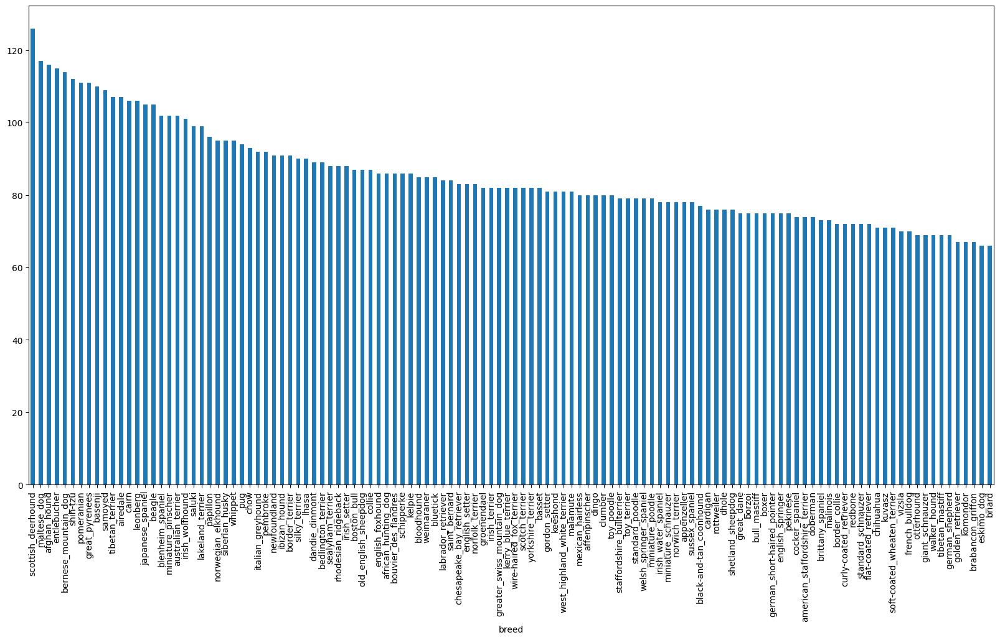

In [ ]:
# How many images are there of each breed?
labels_csv["breed"].value_counts().plot.bar(figsize=(20,10))

In [ ]:
labels_csv['breed'].value_counts().median()

82.0

All dogs have a well balanced number of sample images (82 images each approx), which will help predict breeds uniformly as opposed to some breeds having more images and our model being able to identify those breed better than others!

Google Colab recommends 100 images for each class, and at LEAST 10 images for each class.

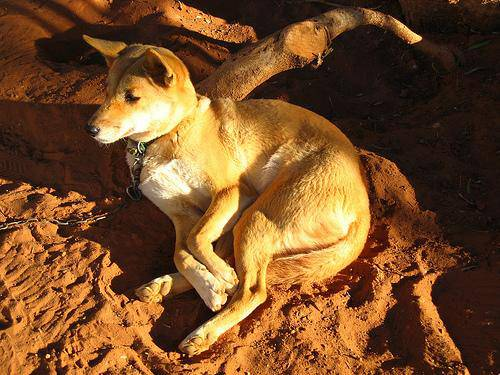

In [ ]:
# Let's view an image
from IPython.display import Image
Image("drive/My Drive/Dog Vision/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg")

### Getting images and their labels

Let's get a list of all of our image files pathnames.

In [ ]:
labels_csv.head()

,id,breed
0,000bec180eb18c7604dcecc8fe0dba07,boston_bull
1,001513dfcb2ffafc82cccf4d8bbaba97,dingo
2,001cdf01b096e06d78e9e5112d419397,pekinese
3,00214f311d5d2247d5dfe4fe24b2303d,bluetick
4,0021f9ceb3235effd7fcde7f7538ed62,golden_retriever


In [ ]:
#Create pathnames from image ID's
filenames = ["drive/My Drive/Dog Vision/train/" + fname + ".jpg" for fname in labels_csv["id"]]
#list comprehension = go through each filename in the id column and save it with the complete path name to the list.

#Check the first 10
filenames[:10]

['drive/My Drive/Dog Vision/train/000bec180eb18c7604dcecc8fe0dba07.jpg',
 'drive/My Drive/Dog Vision/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg',
 'drive/My Drive/Dog Vision/train/001cdf01b096e06d78e9e5112d419397.jpg',
 'drive/My Drive/Dog Vision/train/00214f311d5d2247d5dfe4fe24b2303d.jpg',
 'drive/My Drive/Dog Vision/train/0021f9ceb3235effd7fcde7f7538ed62.jpg',
 'drive/My Drive/Dog Vision/train/002211c81b498ef88e1b40b9abf84e1d.jpg',
 'drive/My Drive/Dog Vision/train/00290d3e1fdd27226ba27a8ce248ce85.jpg',
 'drive/My Drive/Dog Vision/train/002a283a315af96eaea0e28e7163b21b.jpg',
 'drive/My Drive/Dog Vision/train/003df8b8a8b05244b1d920bb6cf451f9.jpg',
 'drive/My Drive/Dog Vision/train/0042188c895a2f14ef64a918ed9c7b64.jpg']

In [ ]:
# Check whether number of filenames matches number of actual image files
import os
if len(os.listdir("drive/My Drive/Dog Vision/train/")) == len(filenames):
  print("Filenames match actual amount of files!!! Proceed.")
else:
  print("Filenames do not match actual amount of files, check the taret directory.")

Filenames match actual amount of files!!! Proceed.


In [ ]:
os.listdir("drive/My Drive/Dog Vision/train/")[:10]
#goes to the specified path and shows the first 10 files in it!

['e236f0b66a5a700022dbed8458e81d26.jpg',
 'de8c32b71a43eef41eb1af93c1baf150.jpg',
 'e4a159a9611f2025cecf53bf8e09699b.jpg',
 'de51f05ddadfb52e97fbc8799891ea8c.jpg',
 'df878b8c7162cab57b3f9e32c595b05f.jpg',
 'e229e4628facf3fb9cd030e0ac484722.jpg',
 'e00443152fb5951922730b21ba08f8f5.jpg',
 'e82fa6e85fd570b2f766635eed62fdf4.jpg',
 'de4cf4fcb0bed47267572b694a77060d.jpg',
 'e3a6203b61fa9cd2ffad92ebe31334ca.jpg']

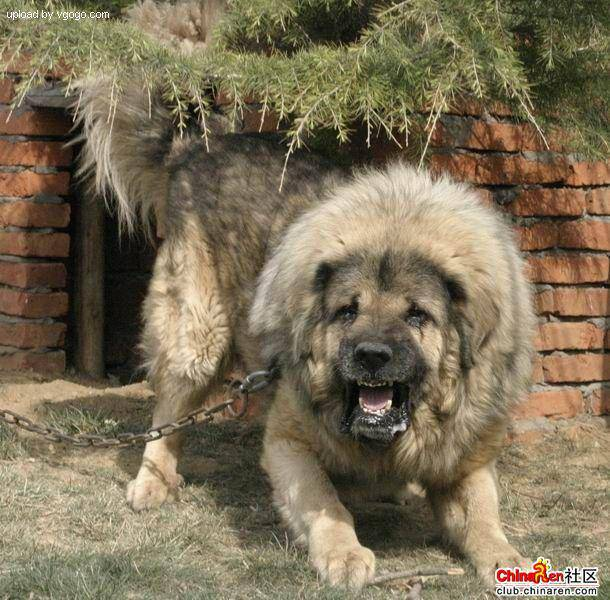

In [ ]:
#One more check
Image(filenames[9000])

In [ ]:
labels_csv['breed'][9000]

'tibetan_mastiff'

Since we've now got our training image filepatsh in a list, let's prepare our labels.

In [ ]:
import numpy as np
labels = labels_csv["breed"].to_numpy()
#does same thing as above -> labels = np.array(labels)
labels

array(['boston_bull', 'dingo', 'pekinese', ..., 'airedale',
       'miniature_pinscher', 'chesapeake_bay_retriever'], dtype=object)

In [ ]:
len(labels)

10222

In [ ]:
# See if number of labels matches the number of filenames
#(We're doing all this to check for missing data as doing so is a bit harder for unstructured data.)
if len(labels) == len(filenames):
  print("Number of labels matches number of filenames!")
else:
  print("Number of labels does not match number of filenames, check data directories!")

Number of labels matches number of filenames!


In [ ]:
# Find the unique label values
unique_breeds = np.unique(labels)
len(unique_breeds)

120

In [ ]:
unique_breeds

array(['affenpinscher', 'afghan_hound', 'african_hunting_dog', 'airedale',
       'american_staffordshire_terrier', 'appenzeller',
       'australian_terrier', 'basenji', 'basset', 'beagle',
       'bedlington_terrier', 'bernese_mountain_dog',
       'black-and-tan_coonhound', 'blenheim_spaniel', 'bloodhound',
       'bluetick', 'border_collie', 'border_terrier', 'borzoi',
       'boston_bull', 'bouvier_des_flandres', 'boxer',
       'brabancon_griffon', 'briard', 'brittany_spaniel', 'bull_mastiff',
       'cairn', 'cardigan', 'chesapeake_bay_retriever', 'chihuahua',
       'chow', 'clumber', 'cocker_spaniel', 'collie',
       'curly-coated_retriever', 'dandie_dinmont', 'dhole', 'dingo',
       'doberman', 'english_foxhound', 'english_setter',
       'english_springer', 'entlebucher', 'eskimo_dog',
       'flat-coated_retriever', 'french_bulldog', 'german_shepherd',
       'german_short-haired_pointer', 'giant_schnauzer',
       'golden_retriever', 'gordon_setter', 'great_dane',
      

In [ ]:
# Turn a single label into an array of booleans
print(labels[0])
labels[0] == unique_breeds
#for every value of unique_breeds, label[0] is not equal, it should return False, and when it is equal, it should return True.

boston_bull


array([False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False,  True, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False])

In [ ]:
#Turn every label into a boolean array
boolean_labels = [label == unique_breeds for label in labels]
#creates a list of boolean arrays for each label.
boolean_labels[:2]

[array([False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False,  True, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False]),
 array([False, False, False, False, False, Fal

In [ ]:
len(boolean_labels) #10222, hence, we've created a boolean array for every single label.

10222

In [ ]:
# Example: turning boolean array into integers
print(labels[0]) #original label
print(np.where(unique_breeds==labels[0])) #index where label occurs in unique_breeds
print(boolean_labels[0].argmax()) #index where label occurs in its boolean array

#converting boolean to int (0 or 1)
print(boolean_labels[0].astype(int)) #there should be a 1 where the sample label occurs

boston_bull
(array([19]),)
19
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0]


In [ ]:
print(labels[2])
print(boolean_labels[2].astype(int))

pekinese
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0]


### Creating our own validation set

Since the dataset from Kaggle doesn't come with a validation set, we're going to create our own.

In [ ]:
# Setup X and y variables
X = filenames
y = boolean_labels

In [ ]:
len(filenames)

10222

We're going to start off experimenting with ~1000 images and increase as needed. (Since it would take realllly long to experiment on 10,000+ images)

In [ ]:
# Set number of images to use for experimenting
#hyperparameters in deep learning are often set in capitals.
NUM_IMAGES = 1000 #@param {type:"slider", min:1000, max:10000, step:1000}

In [ ]:
#Let's split our data into train and validation
from sklearn.model_selection import train_test_split

#Split them into training and validation of total size NUM_IMAGES
X_train, X_val, y_train, y_val = train_test_split(X[:NUM_IMAGES],
                                                  y[:NUM_IMAGES],
                                                  test_size=0.2,
                                                  random_state=42)

len(X_train), len(y_train), len(X_val), len(y_val)

(800, 800, 200, 200)

In [ ]:
#Let's have a geez at the training data
X_train[:5], y_train[:2]

(['drive/My Drive/Dog Vision/train/00bee065dcec471f26394855c5c2f3de.jpg',
  'drive/My Drive/Dog Vision/train/0d2f9e12a2611d911d91a339074c8154.jpg',
  'drive/My Drive/Dog Vision/train/1108e48ce3e2d7d7fb527ae6e40ab486.jpg',
  'drive/My Drive/Dog Vision/train/0dc3196b4213a2733d7f4bdcd41699d3.jpg',
  'drive/My Drive/Dog Vision/train/146fbfac6b5b1f0de83a5d0c1b473377.jpg'],
 [array([False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False,  True,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, Fa

## Preprocessing images (turning images into Tensors)

Tensors are very similar to multidimensional numpy arrays.

Manipulating file paths is easier than manipulating images because its working with less data.

To preprocess our images into Tensors we're going to write a function which does a few things:
1. Take an image filepath as input
2. Use TensorFLow to read the file and sav eit to a variable, `image`
3. Turn our `image` (a jpg) into Tensors
4. Resize the `image` to be a shape of (224,224)
5. Return the modified image

Before we do, let's see what importing an image looks like.

In [ ]:
# Convert an image to a NumPy array
from matplotlib.pyplot import imread
image = imread(filenames[42])
image.shape #(height, width, color channel)
#color channel = RGB color sample (i think we're getting number of colors returned, so RGB -> 3.)

(257, 350, 3)

array([[[ 89, 137,  89],
        [ 76, 124,  76],
        [ 63, 111,  61],
        ...,
        [ 77, 133,  86],
        [ 76, 134,  86],
        [ 76, 134,  86]],

       [[ 72, 119,  75],
        [ 67, 114,  68],
        [ 63, 110,  64],
        ...,
        [ 75, 131,  84],
        [ 74, 132,  84],
        [ 74, 132,  84]],

       [[ 56, 104,  66],
        [ 58, 106,  68],
        [ 64, 112,  74],
        ...,
        [ 71, 127,  82],
        [ 73, 129,  84],
        [ 74, 130,  85]],

       ...,

       [[  2,  11,  10],
        [  5,  14,  11],
        [  8,  14,  14],
        ...,
        [120, 113,  67],
        [126, 118,  71],
        [122, 114,  67]],

       [[  0,   3,   7],
        [  2,   7,  10],
        [  3,   9,   7],
        ...,
        [105,  98,  54],
        [112, 104,  58],
        [111, 103,  57]],

       [[ 16,  18,  30],
        [ 16,  19,  24],
        [ 15,  20,  14],
        ...,
        [101,  92,  51],
        [ 97,  88,  47],
        [120, 111,  70]]], dtype=uint8)
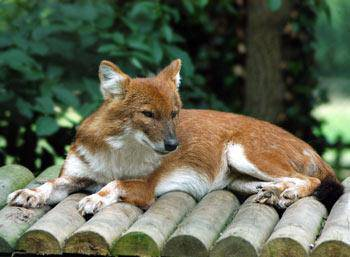

In [ ]:
image

In [ ]:
image.max(), image.min()
#means red, green and blue pixel values are between zero and 2.55.
#that is literally what our image is!

(255, 0)

In [ ]:
#turn image into a tensor
tf.constant(image)[:2]
#turn almost anything into a tensor using tf.constant()

<tf.Tensor: shape=(2, 350, 3), dtype=uint8, numpy=
array([[[ 89, 137,  89],
        [ 76, 124,  76],
        [ 63, 111,  61],
        ...,
        [ 77, 133,  86],
        [ 76, 134,  86],
        [ 76, 134,  86]],

       [[ 72, 119,  75],
        [ 67, 114,  68],
        [ 63, 110,  64],
        ...,
        [ 75, 131,  84],
        [ 74, 132,  84],
        [ 74, 132,  84]]], dtype=uint8)>

Now we've seen what an image looks like as a Tensor, let's write a function to preprocess them:

1. Take an image filepath as input
2. Use TensorFlow to read the file and save it to a variable, image
3. Turn our image (a jpg) into Tensors
4. Normalize our image (convert color channel values from 0 - 255 to 0-1)
5. Resize the image to be a shape of (224,224)
6. Return the modified image

In [ ]:
#Define image size
IMG_SIZE = 224

#Create a function for preprocessing images
def process_image(image_path, img_size=IMG_SIZE):
  """
  Takes an image file path and turns up the image into a Tensor.
  """

  #Read in an image file
  image = tf.io.read_file(image_path) #Reads and outputs the contents of file.

  #Turn the jpeg image into numerical tensor with 3 color channels (Red, Green, Blue)
  image = tf.image.decode_jpeg(image, channels=3)

  #Convert the color channel values from 0-255 to 0-1 values
  image = tf.image.convert_image_dtype(image, tf.float32)

  #Resize the image to out desired value (224,224)
  image = tf.image.resize(image, size=[IMG_SIZE, IMG_SIZE])

  return image


Functions explained using examples below:

In [ ]:
tensor = tf.io.read_file(filenames[26])
tensor
#takes a filename and converts the contents to a long tensor

<tf.Tensor: shape=(), dtype=string, numpy=b'\xff\xd8\xff\xe0\x00\x10JFIF\x00\x01\x01\x00\x00\x01\x00\x01\x00\x00\xff\xdb\x00C\x00\n\x07\x07\x08\x07\x06\n\x08\x08\x08\x0b\n\n\x0b\x0e\x18\x10\x0e\r\r\x0e\x1d\x15\x16\x11\x18#\x1f%$"\x1f"!&+7/&)4)!"0A149;>>>%.DIC<H7=>;\xff\xdb\x00C\x01\n\x0b\x0b\x0e\r\x0e\x1c\x10\x10\x1c;("(;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;\xff\xc0\x00\x11\x08\x01\xf4\x01w\x03\x01"\x00\x02\x11\x01\x03\x11\x01\xff\xc4\x00\x1f\x00\x00\x01\x05\x01\x01\x01\x01\x01\x01\x00\x00\x00\x00\x00\x00\x00\x00\x01\x02\x03\x04\x05\x06\x07\x08\t\n\x0b\xff\xc4\x00\xb5\x10\x00\x02\x01\x03\x03\x02\x04\x03\x05\x05\x04\x04\x00\x00\x01}\x01\x02\x03\x00\x04\x11\x05\x12!1A\x06\x13Qa\x07"q\x142\x81\x91\xa1\x08#B\xb1\xc1\x15R\xd1\xf0$3br\x82\t\n\x16\x17\x18\x19\x1a%&\'()*456789:CDEFGHIJSTUVWXYZcdefghijstuvwxyz\x83\x84\x85\x86\x87\x88\x89\x8a\x92\x93\x94\x95\x96\x97\x98\x99\x9a\xa2\xa3\xa4\xa5\xa6\xa7\xa8\xa9\xaa\xb2\xb3\xb4\xb5\xb6\xb7\xb8\xb9\xba\xc2\xc3\xc4\xc5\xc6\xc7\xc8\xc9\xca

In [ ]:
tensor = tf.image.decode_jpeg(tensor, channels=3)
tensor
#the values are between 0 and 255

<tf.Tensor: shape=(500, 375, 3), dtype=uint8, numpy=
array([[[ 59,  68,  65],
        [ 64,  73,  70],
        [ 71,  80,  77],
        ...,
        [115, 128, 108],
        [115, 128, 108],
        [110, 123, 103]],

       [[ 65,  74,  71],
        [ 72,  81,  78],
        [ 79,  88,  85],
        ...,
        [114, 127, 107],
        [117, 130, 110],
        [116, 129, 109]],

       [[ 68,  77,  74],
        [ 76,  85,  82],
        [ 83,  92,  89],
        ...,
        [114, 127, 107],
        [120, 133, 113],
        [123, 136, 116]],

       ...,

       [[173, 200, 155],
        [164, 179, 136],
        [181, 166, 133],
        ...,
        [255, 255, 255],
        [255, 255, 255],
        [255, 255, 255]],

       [[142, 159, 117],
        [147, 154, 113],
        [189, 174, 141],
        ...,
        [255, 255, 255],
        [255, 255, 255],
        [255, 255, 255]],

       [[167, 179, 139],
        [167, 172, 132],
        [204, 188, 155],
        ...,
        [255, 255, 25

In [ ]:
tf.image.convert_image_dtype(tensor, tf.float32)
#now the values are between 0 and 1 -> which makes computing more efficient

<tf.Tensor: shape=(500, 375, 3), dtype=float32, numpy=
array([[[0.23137257, 0.26666668, 0.25490198],
        [0.2509804 , 0.28627452, 0.27450982],
        [0.2784314 , 0.3137255 , 0.3019608 ],
        ...,
        [0.45098042, 0.5019608 , 0.42352945],
        [0.45098042, 0.5019608 , 0.42352945],
        [0.43137258, 0.48235297, 0.4039216 ]],

       [[0.25490198, 0.2901961 , 0.2784314 ],
        [0.28235295, 0.31764707, 0.30588236],
        [0.30980393, 0.34509805, 0.33333334],
        ...,
        [0.44705886, 0.49803925, 0.41960788],
        [0.45882356, 0.50980395, 0.43137258],
        [0.454902  , 0.5058824 , 0.427451  ]],

       [[0.26666668, 0.3019608 , 0.2901961 ],
        [0.29803923, 0.33333334, 0.32156864],
        [0.3254902 , 0.36078432, 0.34901962],
        ...,
        [0.44705886, 0.49803925, 0.41960788],
        [0.47058827, 0.52156866, 0.4431373 ],
        [0.48235297, 0.53333336, 0.454902  ]],

       ...,

       [[0.6784314 , 0.7843138 , 0.60784316],
        [0.64

## Turning our data into batches

batches - take a small portion of our data, 32 images and calculating those 32 iamges at one time. Then in the next loop we calculate on the next 32 images.  

Why turn our data into batches?

Let's say you're trying to process 10,000+ images in one go... they all might not fit into memory.

So that's why we do 32 (this is batch size) images at a time (you can manually adjust the batch size if need be).

In order to use TensorFlow effectively, we need our data in the form of Tensor tuples which look like this:
`(image, label)`

(So then we'd pass 32 of these at a time to our machine learning model, and it would figure out the patterns in this image that relate to this label, and then it would end up doing that in a sort of loop fashion until it gets through all 10,000 plus images.)

In [ ]:
#Create a simple function to return a tuple (image, label)

def get_image_label(image_path, label):
  """
  Takes an image file path name and the associated label,
  processes the image and returns a tuple of (image, label).
  """
  image = process_image(image_path)
  return image, label

In [ ]:
#Demo of the above on one sample
(get_image_label(X[42], tf.constant(y[42])))
#tf.constant(y[42]) -> to convert our label into a tensor too

(<tf.Tensor: shape=(224, 224, 3), dtype=float32, numpy=
 array([[[0.3264178 , 0.5222886 , 0.3232816 ],
         [0.2537167 , 0.44366494, 0.24117757],
         [0.25699762, 0.4467087 , 0.23893751],
         ...,
         [0.29325107, 0.5189916 , 0.3215547 ],
         [0.29721776, 0.52466875, 0.33030328],
         [0.2948505 , 0.5223015 , 0.33406618]],
 
        [[0.25903144, 0.4537807 , 0.27294815],
         [0.24375686, 0.4407019 , 0.2554778 ],
         [0.2838985 , 0.47213382, 0.28298813],
         ...,
         [0.2785345 , 0.5027992 , 0.31004712],
         [0.28428748, 0.5108719 , 0.32523635],
         [0.28821915, 0.5148036 , 0.32916805]],
 
        [[0.20941195, 0.40692952, 0.25792548],
         [0.24045378, 0.43900946, 0.2868911 ],
         [0.29001117, 0.47937486, 0.32247734],
         ...,
         [0.26074055, 0.48414773, 0.30125174],
         [0.27101526, 0.49454468, 0.32096273],
         [0.27939945, 0.5029289 , 0.32934693]],
 
        ...,
 
        [[0.00634795, 0.03442048

Now we've got a way to turn our data into tuples of Tensors in the form: `(image, label)`, let's make a function to turn all of our data (X & y) into batches!

In [ ]:
#Define the batchs size, 32 is a good start

BATCH_SIZE = 32

#Create a function to turn data into batches
def create_data_batches(X, y=None, batch_size=BATCH_SIZE, valid_data=False, test_data=False):
  """
  Creates batches of data out of image (X) and label (y) pairs
  It shuffles the data if it's training data but doesn't shuffle if it is validation data.
  Also accepts test data as input (no labels).
  """
  #reason why y=None -> Also accepts test data as input (no labels).
  #remember: that default parameters can be overwritten by passed parameters. So we will simply pass y when we want labels in our batches.

  #If the data is a test dataset, we probably don't have labels
  if test_data:
    print("Creating test data batches...")
    data = tf.data.Dataset.from_tensor_slices(tf.constant(X)) #only filepaths, no labels
    #it says -> pass me some tensors and I'll create a dataset out of that.
    data_batch = data.map(process_image).batch(BATCH_SIZE)
    #process images using our function then form them into batches of size BATCH_SIZE.
    return data_batch

  #If the data is a valid dataset, we don't need to shuffle it (also has both filepaths and labels)
  elif valid_data:
    print("Creating validation data batches...")
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X), #filepaths
                                               tf.constant(y))) #labels
    data_batch = data.map(get_image_label).batch(BATCH_SIZE)
    return data_batch

  else:
    print("Creating training data batches...")
    #Turn filepaths and labels into Tensors
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X),
                                               tf.constant(y)))

    #Shuffling pathnames and labels before mapping image processor fucntion is faster than shuffling images.
    data = data.shuffle(buffer_size=len(X)) #len(X) -> shuffle the whole lot

    #Create (image, label) tuples (this also turns the image path into a preprocessed image)
    data = data.map(get_image_label)

    #Turn the training data into batches
    data_batch = data.batch(BATCH_SIZE)

    return data_batch

In [ ]:
#Create training and validation data batches
train_data = create_data_batches(X_train, y_train)
val_data = create_data_batches(X_val, y_val, valid_data=True)

Creating training data batches...
Creating validation data batches...


In [ ]:
#Check out the different attributes of our data batches
train_data.element_spec, val_data.element_spec

#it's now in the format of a data batch which is TensorFlow is preferred way of processing things.

#output ->
#images: shape=(Batchsize(none even tho we said 32), 224, 224, color channel=3)
#labels: 120=dimension (number of unique labels)

((TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)),
 (TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)))

## Visualizing Data Batches

Our data is now in batches, however, these can be a little hard to understand/comprehend, let's visualize them!

In [ ]:
import matplotlib.pyplot as plt

#Create a function for viewing images in a data batch

def show_25_images(images, labels):
  """
  Displays a plot of 25 images and their labels from a data batch.
  """

  #Setup the figure
  plt.figure(figsize=(10,10))

  #loop through 25 (for displaying 25 images)
  for i in range(25):

    #Create subplots (5 rows, 5 columns)
    ax = plt.subplot(5,5,i+1) # no. of rows, no. of cols, index

    #Display an image
    plt.imshow(images[i])

    #Add the image labels as the title
    plt.title(unique_breeds[labels[i].argmax()])
    #argmax - max value(where our 1 is in the boolean array (labels) i assume)
    #then we access that index of dog in unique breed. (eg below)

    #Turn the gridlines off
    plt.axis("off")

In [ ]:
unique_breeds[y[0].argmax()]

'boston_bull'

In [ ]:
train_images, train_labels = next(train_data.as_numpy_iterator())
train_images, train_labels #(both have len = 32)
#convert our batched data into an unbatched iterative

(array([[[[4.00217563e-01, 4.40165877e-01, 4.78286028e-01],
          [4.32882160e-01, 4.58915085e-01, 4.65059280e-01],
          [9.54079106e-02, 1.06380567e-01, 7.41187707e-02],
          ...,
          [2.76614308e-01, 3.08313102e-01, 3.05431157e-01],
          [1.78956568e-01, 2.17148945e-01, 2.26702258e-01],
          [3.35873276e-01, 3.77834946e-01, 3.93376380e-01]],
 
         [[6.60964191e-01, 7.12877274e-01, 7.70080626e-01],
          [7.03994215e-01, 7.44549215e-01, 7.68150985e-01],
          [3.95983756e-01, 4.16020513e-01, 4.01390970e-01],
          ...,
          [3.57770056e-01, 3.58172596e-01, 3.72913539e-01],
          [2.01045588e-01, 2.26485744e-01, 2.39648595e-01],
          [3.48367095e-01, 3.83810163e-01, 3.94275248e-01]],
 
         [[6.71310604e-01, 7.42356122e-01, 8.20398152e-01],
          [7.07412362e-01, 7.65923202e-01, 8.15686882e-01],
          [5.90942264e-01, 6.32321894e-01, 6.43752098e-01],
          ...,
          [3.74211907e-01, 3.41731131e-01, 3.8635

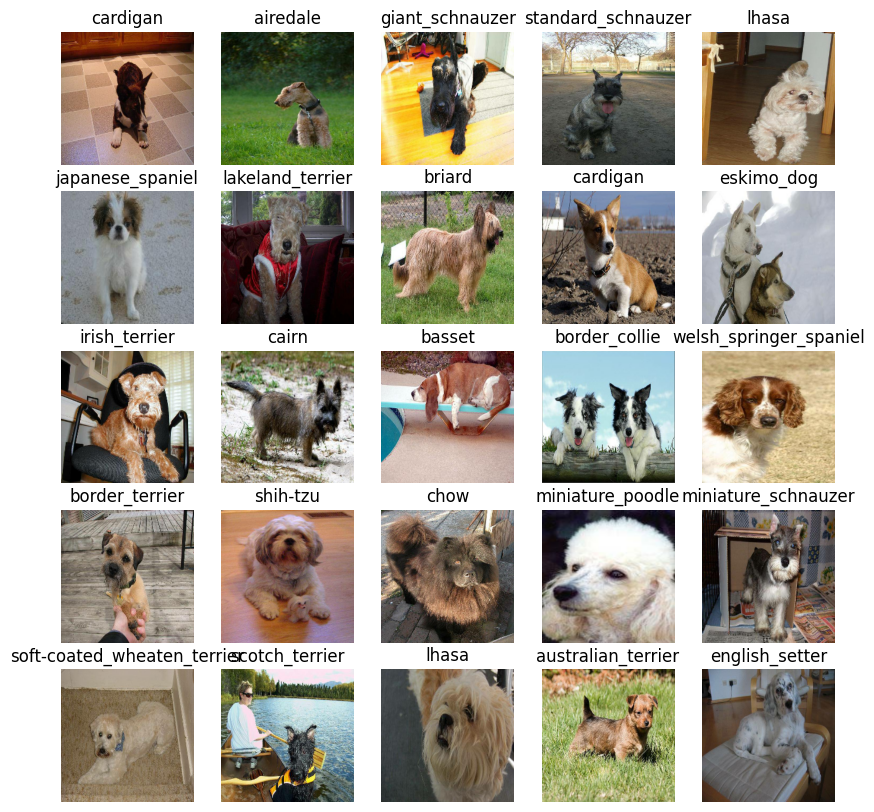

In [ ]:
#Now let's visualise the data in a training batch

train_images, train_labels = next(train_data.as_numpy_iterator())
#everytime we call the training batch, it shuffles the data
#if you rerun this cell, you'll get 25 different dogs everytime

show_25_images(train_images, train_labels)

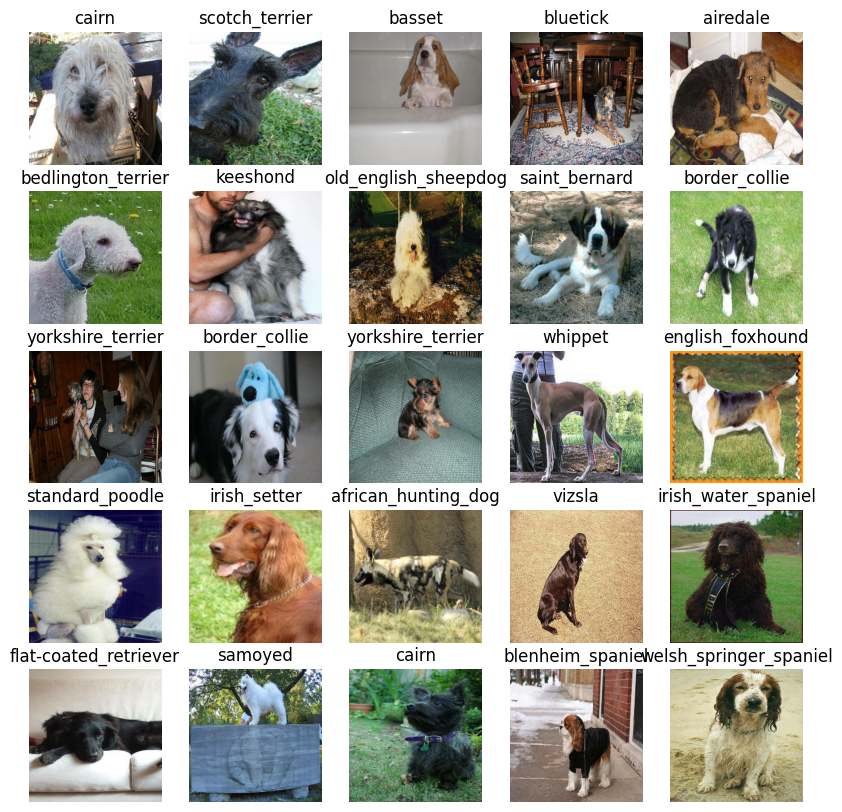

In [ ]:
#Now let's visualize our validation set
val_images, val_labels = next(val_data.as_numpy_iterator())
show_25_images(val_images, val_labels)

 ## Building a model
 (we will be using transfer learning)

 Before we build a model, there are a few things we need to define:
 1. The input shape (our images shape, in the form of Tensors) to our model.
 2. The output shape (image labels, in the form of Tensors) of our model.
 3. The URL of the model we want to use from TensorFlow Hub: "https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4"

In [ ]:
IMG_SIZE

224

In [ ]:
#Setup input shape to the model
INPUT_SHAPE = [None, IMG_SIZE, IMG_SIZE, 3] #batch, height, width, color channel

#Setup output shape of our model
OUTPUT_SHAPE = len(unique_breeds) #outputs an array of len(unique_breeds) that hopefully contains the right label.

#Setup model URL from TensorFlow Hub
MODEL_URL = "https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4"

What is the difference between Keras Functional and Sequential (what we're using) API?
Read: https://www.tensorflow.org/guide/keras

Neural networks have layers, like an input layer, a hidden layer (finds patterns) and an output layer. Keras takes the layers and does the job for us!  

Now we've got our inputs, outputs and model ready to go.
Let's put them together into a Keras deep learning model!

Knowing this, let's create a function which:
* Takes the input shape,output shape, and the model we've chosen as parameters.
* Defines the layers in a Keras model in sequential fashion (do this first, then this, then that).
* Compile the model (says it should be evaluated and improved).
* Builds the model (tells the model the input shape it'll be getting)
* Returns the model.

All of these steps can be found here:
https://www.tensorflow.org/guide/keras

In [ ]:
# Create a function which builds a Keras model
def create_model(input_shape=INPUT_SHAPE, output_shape=OUTPUT_SHAPE, model_url=MODEL_URL):
  print("Building model with:", MODEL_URL)

  # Setup the model layers
  model = tf.keras.Sequential([
    hub.KerasLayer(MODEL_URL), # Layer 1 (input layer)
    tf.keras.layers.Dense(units=OUTPUT_SHAPE,
                          activation="softmax") # Layer 2 (output layer)
  ])

  # Compile the model
  model.compile(
      loss=tf.keras.losses.CategoricalCrossentropy(), # Our model wants to reduce this (how wrong its guesses are)
      optimizer=tf.keras.optimizers.Adam(), # A friend telling our model how to improve its guesses
      metrics=["accuracy"] # We'd like this to go up
  )

  # Build the model
  model.build(INPUT_SHAPE) # Let the model know what kind of inputs it'll be getting

  return model

In [ ]:
model = create_model()
model.summary()


Building model with: https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4
Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 keras_layer (KerasLayer)    (None, 1001)              5432713   
                                                                 
 dense (Dense)               (None, 120)               120240    
                                                                 
Total params: 5552953 (21.18 MB)
Trainable params: 120240 (469.69 KB)
Non-trainable params: 5432713 (20.72 MB)
_________________________________________________________________


These params (5432713 and 120240) are the patterns that mobilenet has learnt by training on imagenet (a large image dataset having millions of images)

That is the beauty of Transfer Learning - we now get to use the patterns mobilenet has already detetcted on our dataset!

## Create callbacks

Callbacks are helper functions a model can use during training to do such things as save its progress, check its progress or stop training early if a model stops improving.

We'll create two callbacks, one for TensorBoard which helps track our models progress and another for early stopping which prevents our model from training for too long (prevents overfitting).

### TensorBoard Callback

To setup a TensorBoard callback we need to do 3 things:

1. Load the Tensorboard notebook extension. ✅
2. Create a Tensorbaord callback which is able to save logs to a directory and pass it to our model's `fit()` function. ✅
3. Visualise our models training logs with the `%tensorboard` magic function (we'll do this after model training) ✅

In [ ]:
# Load TensorBoard notebook extension
%load_ext tensorboard

In [ ]:
import datetime

#Create a function to build a TensorBoard callback

def create_tensorboard_callback():
  #Create a log directory for storing TensorBoard logs
  logdir = os.path.join('drive/MyDrive/Dog Vision/logs', #access path
                        #Make it so the logs get tracked whenever we run an experiment
                        datetime.datetime.now().strftime("%Y%m%d-%H%M%S")) #gets the exact time IRL rn.
  return tf.keras.callbacks.TensorBoard(logdir)

### Early stopping callback

Early stopping helps our model from overfitting by stopping training if a certain evaluation metric stops improving.

https://www.tensorflow.org/api_docs/python/tf/keras/callbacks/EarlyStopping

In [ ]:
#Create early stopping callback
early_stopping = tf.keras.callbacks.EarlyStopping(monitor="val_accuracy",
                                                  patience=3)

## Training a model (on a subset of data)

Our first model is only going to train on 1000 images, to make sure everything is working.

In [ ]:
NUM_EPOCHS = 90 #@param {type:'slider', min:10, max:100, step:10}

#num_epochs = number of chances we're going to give our model to go
#throughout the training dataset and find patterns.

In [ ]:
# Check to make sure we're still running on a GPU
print("GPU", 'available (YESS!!!)' if tf.config.list_physical_devices("GPU")else 'not available :(' )

GPU available (YESS!!!)


Let's create a function which trains a model.

* Create a model using `create_model()`
* Setup a TensorBoard callback using `create_tensorboard_callback()`
* Call the fit() fucntion on our model passing it the training data, validation data, number of epochs to train for (`NUM_EPOCHS`) and the callbacks we'd like to use.
* Return the model

In [ ]:
# Build a function to train and return a trained model
def train_model():
  """
  Trains a given model and returns the trained version.
  """

  #Create a model
  model = create_model()

  #Create new TensorBoard session everytime we train a model
  tensorboard = create_tensorboard_callback()

  #Fit the model to the data passing it the callbacks we created
  model.fit(x=train_data,
            epochs=NUM_EPOCHS,
            validation_data=val_data,
            validation_freq=1, #how often we want to test patterns found on validation set, =1 -> once an epoch (so total 100)
            callbacks=[tensorboard, early_stopping])

  #Return the fitted model
  return model

In [ ]:
#Fit the model to the data
model = train_model()

Building model with: https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4
Epoch 1/90
25/25 [==============================] - 166s 239ms/step - loss: 4.5813 - accuracy: 0.1025 - val_loss: 3.4161 - val_accuracy: 0.2300
Epoch 2/90
25/25 [==============================] - 4s 154ms/step - loss: 1.6539 - accuracy: 0.6737 - val_loss: 2.2042 - val_accuracy: 0.5000
Epoch 3/90
25/25 [==============================] - 6s 222ms/step - loss: 0.5814 - accuracy: 0.9362 - val_loss: 1.6859 - val_accuracy: 0.5850
Epoch 4/90
25/25 [==============================] - 4s 164ms/step - loss: 0.2544 - accuracy: 0.9950 - val_loss: 1.5022 - val_accuracy: 0.6050
Epoch 5/90
25/25 [==============================] - 4s 149ms/step - loss: 0.1484 - accuracy: 0.9975 - val_loss: 1.4300 - val_accuracy: 0.6050
Epoch 6/90
25/25 [==============================] - 5s 218ms/step - loss: 0.1014 - accuracy: 0.9987 - val_loss: 1.3759 - val_accuracy: 0.6300
Epoch 7/90
25/25 [==============================] - 5

we stopped at 12/100 epochs, because we can see that our model is overfitting (training accuracy = 100% and val_accuracy = 65%) meaning our model has memorised the study material and is now struggling on the practice test! i.e. our model currenlty has a poor ability to generalise.

**Question:** It looks like our model is overfitting because it's performing far better on the training dataset than te validation dataset, what are some ways to prevent model overfitting in deep learning neural networks?

**Note:** Overfitting to begin with is a good thing! It means our model is learning!!!

### Checking the TensorBoard logs

The TensorBoard magic fucntion (`%tensorboard`) will access the logs directory we created earlier and visualise its contents.

In [ ]:
%tensorboard --logdir drive/My\ Drive/Dog\ Vision/logs #direct comand line code

Reusing TensorBoard on port 6006 (pid 19508), started 0:00:08 ago. (Use '!kill 19508' to kill it.)

<IPython.core.display.Javascript object>

 ## Making and evaluating predictions using a trained model

In [ ]:
# Make predictions on the validation data (not used to train on)
predictions = model.predict(val_data, verbose=1)
#verbose->when making predictions, show progress
predictions

7/7 [==============================] - 2s 150ms/step


array([[4.4198646e-04, 2.1066135e-05, 2.9698424e-03, ..., 1.4108272e-03,
        1.6958300e-05, 3.0783606e-03],
       [2.0999990e-03, 2.0182997e-03, 1.7782366e-02, ..., 1.4751868e-03,
        2.4701371e-03, 8.4154349e-04],
       [6.5231575e-06, 2.4320056e-05, 4.9586612e-05, ..., 2.0866949e-04,
        2.8236171e-05, 4.8653448e-05],
       ...,
       [2.1990611e-05, 1.3796885e-04, 6.4893778e-05, ..., 2.1826586e-06,
        1.9076161e-04, 7.5918995e-04],
       [2.5913403e-03, 1.7347194e-04, 7.0625450e-05, ..., 3.8802810e-04,
        9.2388756e-05, 4.6270085e-03],
       [7.2016126e-05, 1.2400765e-04, 4.5161732e-03, ..., 1.5685346e-02,
        1.0239964e-03, 1.6104984e-04]], dtype=float32)

In [ ]:
predictions.shape #we have 200 arrays, each of 120 different numbers
#(200 images in val_dataset, 800 in training dataset)

(200, 120)

In [ ]:
len(y_val), len(unique_breeds)

(200, 120)

In [ ]:
predictions[0] #predictions for one image
#each of these numbers is a probability for the likeliness of the image to be a specific dog breed.
#The highest one is the breed our model thinks this dog image is.

array([4.53161029e-03, 7.97318498e-05, 1.06100237e-03, 5.33255698e-05,
       1.26218671e-04, 6.45422188e-05, 1.83525290e-02, 7.47919665e-04,
       7.40827600e-05, 3.81200633e-04, 3.09441530e-04, 2.73720143e-05,
       8.30392019e-05, 9.25854329e-05, 1.41670112e-03, 6.05115434e-04,
       2.18071218e-05, 1.77648962e-01, 1.05927240e-04, 1.36246117e-05,
       1.06676525e-04, 8.71356635e-04, 2.15638975e-05, 1.19573320e-03,
       3.00263455e-05, 2.72768753e-04, 5.09097338e-01, 9.12161195e-05,
       2.68979580e-03, 1.03537017e-03, 9.74199793e-05, 7.27545703e-04,
       5.77691826e-04, 1.88651120e-05, 1.13827846e-04, 9.77791287e-03,
       1.92411953e-05, 3.31495423e-04, 7.71496780e-05, 1.21114463e-04,
       7.05212529e-04, 7.01883255e-05, 1.29306412e-04, 1.81170471e-04,
       4.15090699e-06, 3.21474290e-05, 3.88462686e-05, 1.17210300e-04,
       1.60635565e-04, 7.63838252e-05, 8.16616448e-05, 1.67937484e-04,
       6.17634854e-04, 4.61214076e-05, 3.86837375e-04, 1.27802385e-04,
      

In [ ]:
np.sum(predictions[0])
#almost = 1 because we used activation='softmax'!

1.0

In [ ]:
# First prediction
index=42
print(predictions[0])
print(f'Max value (probability of prediction): {np.max(predictions[index])}')
print(f"Sum:{np.sum(predictions[index])}")
print(f"Max index: {np.argmax(predictions[index])}")
print(f"Predicted label: {unique_breeds[np.argmax(predictions[index])]}")

[4.53161029e-03 7.97318498e-05 1.06100237e-03 5.33255698e-05
 1.26218671e-04 6.45422188e-05 1.83525290e-02 7.47919665e-04
 7.40827600e-05 3.81200633e-04 3.09441530e-04 2.73720143e-05
 8.30392019e-05 9.25854329e-05 1.41670112e-03 6.05115434e-04
 2.18071218e-05 1.77648962e-01 1.05927240e-04 1.36246117e-05
 1.06676525e-04 8.71356635e-04 2.15638975e-05 1.19573320e-03
 3.00263455e-05 2.72768753e-04 5.09097338e-01 9.12161195e-05
 2.68979580e-03 1.03537017e-03 9.74199793e-05 7.27545703e-04
 5.77691826e-04 1.88651120e-05 1.13827846e-04 9.77791287e-03
 1.92411953e-05 3.31495423e-04 7.71496780e-05 1.21114463e-04
 7.05212529e-04 7.01883255e-05 1.29306412e-04 1.81170471e-04
 4.15090699e-06 3.21474290e-05 3.88462686e-05 1.17210300e-04
 1.60635565e-04 7.63838252e-05 8.16616448e-05 1.67937484e-04
 6.17634854e-04 4.61214076e-05 3.86837375e-04 1.27802385e-04
 2.23764873e-04 2.02890672e-03 2.38272463e-04 1.64786093e-02
 4.40019066e-04 2.10713319e-04 2.03973334e-03 1.57910254e-05
 1.55896414e-04 2.817029

Having the above functionality is great but we want to be able to do it at scale.

And it would be even better if we could see the image the prediction is being made on!

**Note:** Prediction probabilities are also known as confidence levels.

In [ ]:
#Turn prediction probabilities into their respective label (easier to understand)
def get_pred_label(prediction_probabilities):
  """
  Turns an array of prediction probabilities into a label.
  """

  return unique_breeds[np.argmax(prediction_probabilities)]

#Get a predicted label based on an array of prediction probabilities
pred_label = get_pred_label(predictions[81])
pred_label

In [ ]:
val_data #currently in batch form

<_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

Now since our validation data is still in a batch dataset, we'll have to unbatchify it to make predictions on the validation images and then compare those predictions to the validation labels (truth labels).

I think we unbatch to get the images and TRUE labels, we have the predictions now and we need the truth labels now to evaluate and visualise.

In [ ]:
# Create a function to unbatch a batched dataset
def unbatchify(data):
  """
  Takes a batched dataset of (image, label) Tensors and returns separate arrays
  of images and labels.
  """
  images = []
  labels = []
  # Loop through unbatched data
  for image, label in data.unbatch().as_numpy_iterator():
    images.append(image)
    labels.append(unique_breeds[np.argmax(label)])
  return images, labels

# Unbatchify the validation data
val_images, val_labels = unbatchify(val_data)
val_images[0], val_labels[0] #images and true labels

Now we've got ways to get:
* Prediction labels
* Validation labels (truth labels)
* Validation images

Let's make some function to make these all a bit more visualized.

We'll create a function which:
* Takes an array of prediciton probabilites, an array of truth labels and an array of aimages and an integer.
* Convert the prediction probabilities to a predicted label.
* Plot the predicted label, its predicted probability, the truth label and the target image on a single plot.

In [ ]:
def plot_pred(prediction_probabilities, labels, images, n=1):
  """
  View the prediction, ground truth and image for sample n
  """
  pred_prob, true_label, image = prediction_probabilities[n], labels[n], images[n]

  #Get the pred label
  pred_label = get_pred_label(pred_prob)

  #Plot image & remove ticks
  plt.imshow(image)
  plt.xticks([]) #empty list - nothing shows up, i.e. we're basically turning it off.
  plt.yticks([])

  #Change the color of the title depending on if the prediction is right or wrong
  if pred_label == true_label:
    color = "green"
  else:
    color = "red"

  #Change plot title to be predicted, probability of prediction and truth label
  plt.title("{} {:2.0f}% ({})".format(pred_label, #reduces amt of decimal points in our pred_prob
                                      np.max(pred_prob)*100,
                                      true_label),
                                      color=color)


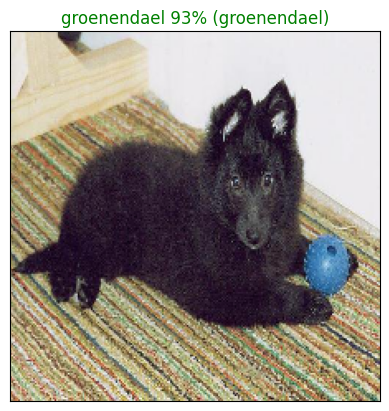

In [ ]:
plot_pred(prediction_probabilities=predictions,
          labels=val_labels,
          images=val_images,
          n=77)

Now we've got one function to visualise our models top prediction, let's make another to view our models top 10 predictions.

This function will:
* Take an input of prediction prbabilities array and a ground truth array and an integer.
* Find the prediction using `get_pred_label()`
* Find the top 10:
  * Predition probab indexes
  * Prediction probab values
  * Prediction labels
* Plot the top 10 prediction probab values and labels, coloring the true label green.

In [ ]:
def plot_pred_conf(prediction_probabilites, labels, n=1):
  """
  Plot the top 10 highest prediction confidences along with the truth label for sample n
  """
  pred_prob, true_label = prediction_probabilites[n], labels[n]

  #Get the predicted label
  pred_label = get_pred_label(pred_prob)

  #Find the top 10 prediction confidence indexes
  top_10_pred_indexes = pred_prob.argsort()[-10:][::-1]

  #Find the tp 10 prediction confidence values
  top_10_pred_values = pred_prob[top_10_pred_indexes]

  #Find the top 10 prediction labels
  top_10_pred_labels = unique_breeds[top_10_pred_indexes]

  #Setup plot
  top_plot = plt.bar(np.arange(len(top_10_pred_labels)), #x = pred labels
                     top_10_pred_values,
                     color="grey")
  plt.xticks(np.arange(len(top_10_pred_labels)),
             labels=top_10_pred_labels,
             rotation="vertical")

  #Change the color of the true label
  if np.isin(true_label, top_10_pred_labels):
    top_plot[np.argmax(top_10_pred_labels == true_label)].set_color("green")
  else:
    pass

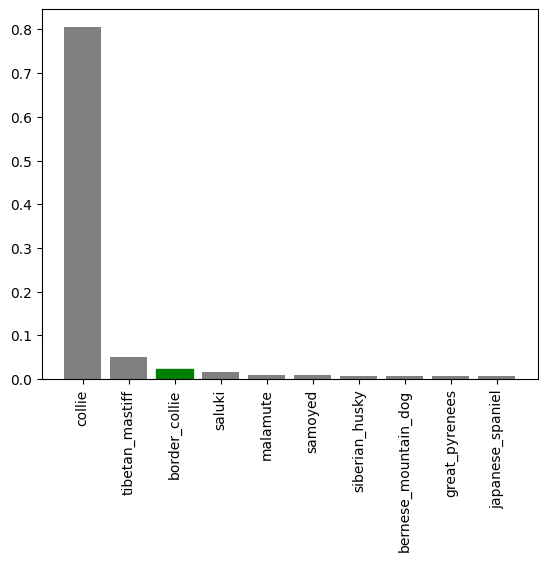

In [ ]:
plot_pred_conf(prediction_probabilites=predictions,
               labels=val_labels,
               n=9)

In [ ]:
predictions[0].argsort()
#it gives us the order of indexes that will sort the array predictions[0].
#i.e. at index = 44, the smallest pred_probab number is located and the largest at 17
#(our model thinks the dog is of breed unique_breeds[17]!)

array([ 44,  36,  46,  39, 115, 118,  41,   8,  92,   1,  19, 107,  42,
        18,   3,  61, 101,  63,  66,  33,  84,  69, 108,   5,  94,  14,
        22, 113,  86,  55,  27,  51,  11,  54,  72,  34,  16,  45,  53,
        67,  75,  24,  47,  28,  38, 114, 112,  99,  85,  13,  88,  25,
        96,   9,  30,  31,   4,  23,  71,  56,  29,   7,  87,  60,  37,
        91,  43, 104,   0,  49,  10, 110, 111, 105,  64,  21,  48,  52,
        32,  82,  50,  58,  12,  20,  15,  76,  98, 117,  78,  68,  95,
        89,  62,  74,  97, 116,  80,  90,  40,   2, 119,  93,  57, 106,
        81, 100, 103,  83,  79,  73,  35,  77, 109,   6, 102,  65,  70,
        59,  26,  17])

In [ ]:
predictions[0].argsort()[-10:][::-1]
#top 10 indexes (reversed to get them in descending order)

#predictions[0][predictions[0].argsort()[-10:][::-1]] -> to get the values at those indexes.

array([ 17,  26,  59,  70,  65, 102,   6, 109,  77,  35])

Now we've got some functions to help us visualize our predictions and evaluate our model, let's check out a few.

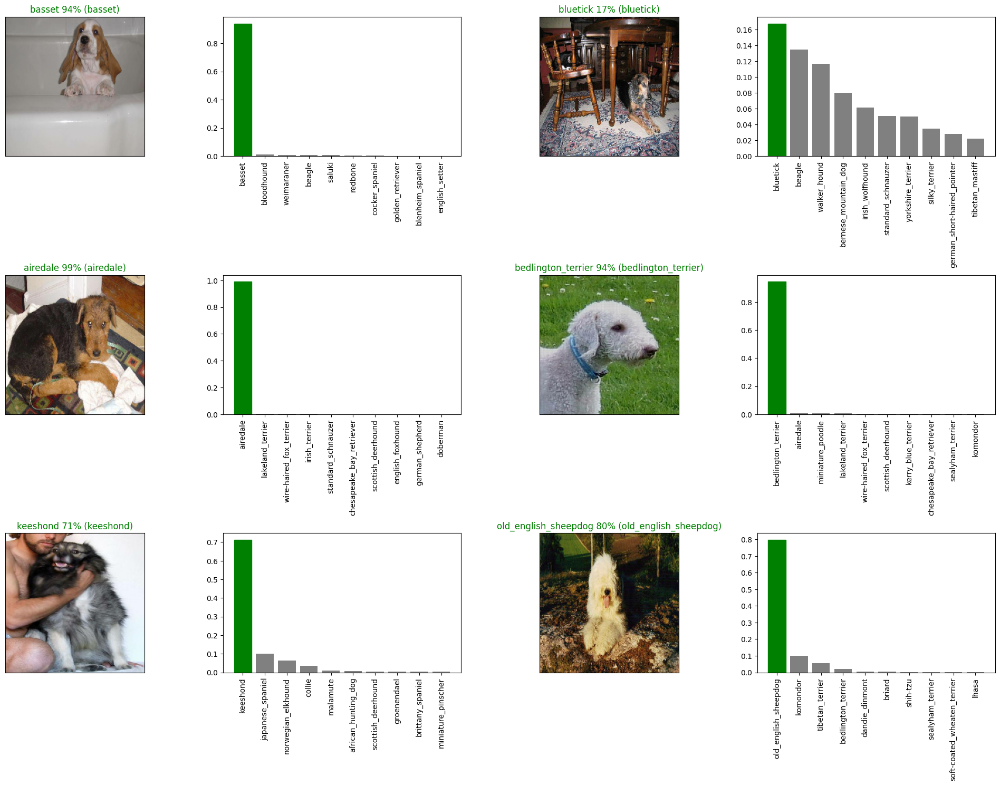

In [ ]:
# Let's check out a few preds and their different values

i_multiplier = 2 #change to get diff images!
num_rows = 3
num_cols = 2
num_images = num_rows*num_cols
plt.figure(figsize=(10*num_cols, 5*num_rows))
for i in range(num_images):
   plt.subplot(num_rows, 2*num_cols, 2*i+1)
   plot_pred(prediction_probabilities=predictions,
             labels=val_labels,
             images=val_images,
             n=i+i_multiplier)
   plt.subplot(num_rows, 2*num_cols, 2*i+2)
   plot_pred_conf(prediction_probabilites=predictions,
                  labels=val_labels,
                  n=i+i_multiplier)
plt.tight_layout(h_pad=1.0)
plt.show()

**Challenge:** How would you create a confusion matrix with our models predictions and true labels?

## Saving and reloading a model

In [ ]:
def save_model(model, suffix=None):
  """
  Saves a given model in a models directory and appends a suffix (str)
  for clarity and reuse.
  """
  # Create model directory with current time
  modeldir = os.path.join("drive/My Drive/Dog Vision/models",
                          datetime.datetime.now().strftime("%Y%m%d-%H%M%s"))
  model_path = modeldir + "-" + suffix + ".h5" # save format of model
  print(f"Saving model to: {model_path}...")
  model.save(model_path)
  return model_path

In [ ]:
# Create a function to load a trained model
def load_model(model_path):
  """
  Loads a saved model from a specified path.
  """
  print(f"Loading saved model from:{model_path}")
  model = tf.keras.models.load_model(model_path,
                                     custom_objects={"KerasLayer":hub.KerasLayer})
  return model

Now we've got functions to save and load a trained model, let's make sure they work!

In [ ]:
# Save our model trained on 1000 images
save_model(model,suffix="1000-images-mobilenetv2-Adam")

Saving model to: drive/My Drive/Dog Vision/models/20240702-08361719909377-1000-images-mobilenetv2-Adam.h5...


'drive/My Drive/Dog Vision/models/20240702-08361719909377-1000-images-mobilenetv2-Adam.h5'

In [ ]:
#Load a trained model
loaded_1000_image_model = load_model("drive/My Drive/Dog Vision/models/20240702-08361719909377-1000-images-mobilenetv2-Adam.h5")

Loading saved model from:drive/My Drive/Dog Vision/models/20240702-08361719909377-1000-images-mobilenetv2-Adam.h5


In [ ]:
# Evaluate the pre-saved mdoel
model.evaluate(val_data)

7/7 [==============================] - 1s 99ms/step - loss: 1.2874 - accuracy: 0.6500


[1.287427544593811, 0.6499999761581421]

In [ ]:
#Evaluate the loaded model
loaded_1000_image_model.evaluate(val_data)

7/7 [==============================] - 2s 108ms/step - loss: 1.2874 - accuracy: 0.6500


[1.287427544593811, 0.6499999761581421]

## Training a big dog 🐶 model (on the full data)

In [ ]:
# Create a data batch with the full dataset
full_data = create_data_batches(X, y)

Creating training data batches...


In [ ]:
full_data

<_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

In [ ]:
# Create a model for full model
full_model = create_model()

Building model with: https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4


In [ ]:
# Create full model callbacks
full_model_tensorboard = create_tensorboard_callback()

# No validation set when training on all the data, so we can't monitor validation accuracy

full_model_early_stopping = tf.keras.callbacks.EarlyStopping(monitor="accuracy",
                                                             patience=3)

**Note:** Running the cell below will take a little while (maybe upto 30 mins for the first epoch) because the GPU we're using in the runtime has to load all of the images into memory.

In [ ]:
# Fit the full model to the full data
full_model.fit(x=full_data,
               epochs=NUM_EPOCHS,
               callbacks=[full_model_tensorboard, full_model_early_stopping])

Epoch 1/90
320/320 [==============================] - 41s 125ms/step - loss: 0.0099 - accuracy: 0.9990
Epoch 2/90
320/320 [==============================] - 41s 128ms/step - loss: 0.0105 - accuracy: 0.9987
Epoch 3/90
320/320 [==============================] - 41s 128ms/step - loss: 0.0084 - accuracy: 0.9990
Epoch 4/90
320/320 [==============================] - 45s 141ms/step - loss: 0.0092 - accuracy: 0.9989


In [ ]:
save_model(full_model, suffix="full-image-set-mobilenetv2-Adam")

Saving model to: drive/My Drive/Dog Vision/models/20240702-09271719912436-full-image-set-mobilenetv2-Adam.h5...


'drive/My Drive/Dog Vision/models/20240702-09271719912436-full-image-set-mobilenetv2-Adam.h5'

In [ ]:
# Load in the full model
loaded_full_model = load_model("drive/My Drive/Dog Vision/models/20240702-09271719912436-full-image-set-mobilenetv2-Adam.h5")

Loading saved model from:drive/My Drive/Dog Vision/models/20240702-09271719912436-full-image-set-mobilenetv2-Adam.h5


## Making predictions on the test dataset

Since our model has been trained on images in the form of Tensor batches, to make predictions on the test data, we'll have to get it into the same format.

Luckily we created `create_data_batches()` earlier which can take a list of filenames as input and convert the, into Tensor batches.

To make predictions ont eh test data, we'll:
* Get the test data filenames
* Convert the filenames into test data batches using `create_data_batches()` and setting the `test_data` parameter to `True` (since the test data doesn't have labels).
* Make a predictions array by passing the test batches to the predict() method called on our model.

In [ ]:
# Load test image filenames
test_path = "drive/MyDrive/Dog Vision/test/"
test_filenames = [test_path + fname for fname in os.listdir(test_path)]
test_filenames[:10]

['drive/MyDrive/Dog Vision/test/9c2d24897586167cae2c8a0333b109f5.jpg',
 'drive/MyDrive/Dog Vision/test/9c367f64333c1f6a15af6374a98ea194.jpg',
 'drive/MyDrive/Dog Vision/test/9c3c4d2f72310435a7107303e50e5ec5.jpg',
 'drive/MyDrive/Dog Vision/test/9c4aaa9c34c291a0fbcc5eb5136a3481.jpg',
 'drive/MyDrive/Dog Vision/test/9c4b7039ae06959859cb1369d6450079.jpg',
 'drive/MyDrive/Dog Vision/test/9c57871c52d52861dd9d5bffde87dcc6.jpg',
 'drive/MyDrive/Dog Vision/test/9c4e255917cd992d64adbf293ea4a856.jpg',
 'drive/MyDrive/Dog Vision/test/9c5dc5339dddb885e3d5a109e262ae7f.jpg',
 'drive/MyDrive/Dog Vision/test/9c6451fbe3f7734ff3fe000b9c2de313.jpg',
 'drive/MyDrive/Dog Vision/test/9c659a53dfb080036738108fdda4bcb5.jpg']

In [ ]:
len(test_filenames)

10357

In [ ]:
#Create test data batch
test_data = create_data_batches(test_filenames, test_data=True)

Creating test data batches...


In [ ]:
test_data

<_BatchDataset element_spec=TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None)>

**Note:**Calling `predict()` on our full model and passing it the test data batch will take a long time to run (about an ~1 hour)

In [ ]:
# Make predictions on test data batch using the loaded full model
test_predictions = loaded_full_model.predict(test_data,
                                             verbose=1)

324/324 [==============================] - 402s 1s/step


In [ ]:
# Save predictions (NumPy array) to csv file (for access later)
np.savetxt("drive/My Drive/Dog Vision/preds_array.csv", test_predictions, delimiter=',')

In [ ]:
#Load predictiond (NumPy array) from csv file
test_predictions = np.loadtxt('drive/My Drive/Dog Vision/preds_array.csv', delimiter=",")

In [ ]:
test_predictions[:10]

array([[4.13140899e-09, 9.96399760e-01, 2.66608025e-09, ...,
        9.56451913e-08, 4.20995738e-11, 6.57841692e-09],
       [2.83461441e-06, 4.97064390e-10, 6.51429561e-12, ...,
        6.02712257e-14, 1.18378951e-08, 1.78069032e-10],
       [3.51583324e-12, 8.68712102e-10, 1.41319866e-12, ...,
        9.48144081e-12, 9.41579510e-14, 1.88011118e-15],
       ...,
       [4.11579798e-12, 2.13670132e-13, 2.33884396e-12, ...,
        1.73367894e-07, 2.71966001e-05, 3.09497566e-11],
       [4.81820843e-15, 6.57727817e-10, 2.45982557e-11, ...,
        2.48875720e-09, 2.16094278e-16, 5.62062815e-15],
       [1.24959584e-07, 1.80338289e-09, 8.11552567e-08, ...,
        4.91571752e-03, 1.30897725e-03, 3.53891778e-08]])

In [ ]:
test_predictions.shape

(10357, 120)

## Preparing test dataset predictions for Kaggle

Looking at the Kaggle sample submission, we find that it wants our models prediction probability outputs in a DataFrame with an ID and a column for each different dog brred.
https://www.kaggle.com/c/dog-breed-identification/overview/evaluation

To get the data in this format, we'll:
* Create a pandas DataFrame with an ID column as well as a column for each dog breed.
* Add data to the ID column by extracting the test image ID's from their filepaths.
* Add data (the prediction probabilities) to each of the dog breed columns.
* Export the DataFrame as a CSV to submit it to Kaggle.  

In [ ]:
# Create a pandas DataFrame with empty columns
preds_df = pd.DataFrame(columns=['id'] + list(unique_breeds)) #col names
preds_df.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier


In [ ]:
# Append test image IDs to predictions DataFrame
test_ids = [os.path.splitext(path)[0] for path in os.listdir(test_path)]
preds_df["id"] = test_ids
#os.path.splitext(path) -> seperates the ID and .jpg
#os.path.splitext(path)[0] -> keeps only the ID (first col) and removes .jpg

In [ ]:
preds_df.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier
0,9c2d24897586167cae2c8a0333b109f5,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,9c367f64333c1f6a15af6374a98ea194,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,9c3c4d2f72310435a7107303e50e5ec5,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,9c4aaa9c34c291a0fbcc5eb5136a3481,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,9c4b7039ae06959859cb1369d6450079,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [ ]:
# Add the prediction probabilities to each dog breed column
preds_df[list(unique_breeds)] = test_predictions
preds_df.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier
0,9c2d24897586167cae2c8a0333b109f5,4.131409e-09,9.963998e-01,2.666080e-09,1.061520e-12,1.006776e-10,2.201431e-09,2.687760e-08,9.235486e-11,1.428141e-10,...,2.116334e-08,1.022091e-11,1.789894e-09,1.733909e-08,4.970700e-09,1.372002e-11,3.810435e-12,9.564519e-08,4.209957e-11,6.578417e-09
1,9c367f64333c1f6a15af6374a98ea194,2.834614e-06,4.970644e-10,6.514296e-12,4.390795e-11,1.705323e-09,9.206046e-12,1.875252e-15,1.010654e-08,1.938426e-06,...,6.912569e-10,3.162804e-12,3.482145e-12,1.738472e-10,1.788896e-12,3.931618e-09,3.355054e-10,6.027123e-14,1.183790e-08,1.780690e-10
2,9c3c4d2f72310435a7107303e50e5ec5,3.515833e-12,8.687121e-10,1.413199e-12,4.468680e-12,5.665189e-09,5.435470e-11,1.439078e-11,2.651080e-10,1.367218e-09,...,1.825350e-09,2.073008e-11,1.302594e-10,4.677480e-07,4.977106e-09,1.890449e-12,7.931310e-08,9.481441e-12,9.415795e-14,1.880111e-15
3,9c4aaa9c34c291a0fbcc5eb5136a3481,2.164012e-09,3.556062e-10,9.195891e-12,2.769404e-06,1.195648e-10,5.183211e-12,1.497156e-12,2.729988e-14,2.482248e-14,...,1.478787e-10,4.924715e-11,1.869526e-10,1.377316e-11,2.017598e-11,4.191508e-12,1.030665e-11,9.452131e-11,1.528485e-13,9.703928e-08
4,9c4b7039ae06959859cb1369d6450079,1.232811e-13,9.356538e-15,5.744950e-10,3.501001e-11,1.359450e-11,2.277265e-13,3.731766e-12,6.664423e-10,2.968932e-11,...,1.045437e-11,9.894259e-08,1.521439e-09,1.671666e-13,3.355281e-12,1.284470e-15,1.203501e-12,9.222445e-08,2.844907e-13,1.503769e-12


In [ ]:
#Save our predictions dataframe to CSV for submission to Kaggle
preds_df.to_csv("drive/My Drive/Dog Vision/full_model_predictions_submission_1_mobilenetV2.csv",
                index=False)

## Making predictions on custom images

To make predictions on custom images, we'll:
* Get the
file paths of our own images.
* Turn the filepaths into data batches using `create_data_batches()`. And since our custom images won't have labels, we set the `test_data` parameter to `True`.
* Pass the column image data batch to our model's `predict()` method.
* Convert the prediction output probabilities to prediction labels.
* Compare the predicted labels to the custom images.

In [ ]:
# Get custom image filepaths
custom_path = "drive/My Drive/Dog Vision/my-dog-photos/"
custom_image_paths = [custom_path + fname for fname in os.listdir(custom_path)]

In [ ]:
custom_image_paths

['drive/My Drive/Dog Vision/my-dog-photos/istockphoto-490849353-612x612.jpg',
 'drive/My Drive/Dog Vision/my-dog-photos/istockphoto-450726311-612x612.jpg',
 'drive/My Drive/Dog Vision/my-dog-photos/istockphoto-509092254-612x612.jpg']

In [ ]:
# Turn custom images into batch datasets
custom_data = create_data_batches(custom_image_paths, test_data=True)
custom_data

Creating test data batches...


<_BatchDataset element_spec=TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None)>

In [ ]:
#Make predictions on the custom data
custom_preds = loaded_full_model.predict(custom_data)

1/1 [==============================] - 2s 2s/step


In [ ]:
custom_preds.shape

(3, 120)

In [ ]:
# Get custom image prediction labels
custom_pred_labels = [get_pred_label(custom_preds[i]) for i in range(len(custom_preds))]
custom_pred_labels

['miniature_poodle', 'golden_retriever', 'shetland_sheepdog']

In [ ]:
#Get custom images (our unbatchify() function won't work since there aren't any labels... mayeb we could fix this later)
custom_images = []
#Loop through unbatched data
for image in custom_data.unbatch().as_numpy_iterator():
  custom_images.append(image)

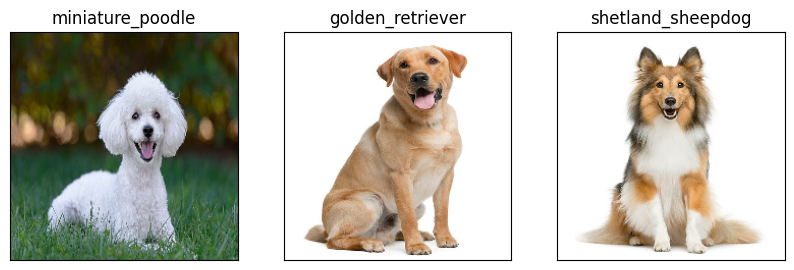

In [ ]:
# Check custom image predictions
plt.figure(figsize=(10,10))
for i, image in enumerate(custom_images):
  plt.subplot(1,3,i+1)
  plt.xticks([])
  plt.yticks([])
  plt.title(custom_pred_labels[i])
  plt.imshow(image)